# Example of Phase Jump Detection
Authors: S. Viotto (viotto1@uni-potsdam.de), B. Bookhagen (bodo.bookhagen@uni-potsdam.de)

This jupyter lab describes how to detect phase jumps using the provided code.
 
- The program only works with interferogram stacks in radar coordinates, so we cannot process geocoded interferograms. For example, we can process interferograms from the ISCE environment that have not yet been geocoded. But we cannot ingest interferograms provided by the Alaska SAR Facility since they are already geocoded.
- The burst overlap along the azimuth direction does not match between different subswaths. Therefore, the script will fail if the interferograms to be processed come from merging adjacent subswaths, and an area of interest is not specified. In those cases, use the following option:
  
```python
--sub-x X0 X1
```
to specify the area of interest.

- Interferograms should not be clipped along the y-direction (azimuthal direction). This means that in the settings file for loading the file by MintPy, *smallbaselineApp.cfg* the mintpy.subset.yx option must be set to auto.

```python
mintpy.subset.yx            = auto    #[y0:y1,x0:x1 / no], auto for no
```



## Prepare the data

- Load the stack to MintPy. Do not apply any subset in the azimuth direction (Y).
```bash
  #Prepare rsc files per input file
  prep_isce.py  -f "./merged/interferograms/*/filt_*.unw" -m ./reference/IW3.xml -b ./baselines/ -g ./merged/geom_reference/
  
  #LOad the stack
  smallbaselineApp.py smallbaselineApp.cfg --dostep 'load_data'

```
- Find out the number of bursts processed over the area of interest. In a terminal/bash navigate to the ISC folder that you have used to generate the stack.

```bash
  #The highest or last number is the number of bursts processed
  ls reference/IW1/*  
```

## Example: information about the stack

- Track Number 10
- Orbit: Descending
- Number of interferograms:462
- Number of burst processed
- Area of Interes: Central Andes, NW Argentina.

## Run the program

In [1]:
!python calculate_phasejumps_from_mintpystack.py -h

usage: calculate_phasejumps_from_mintpystack.py [-h] --inDir IN_DIR --n-burst
                                                N_BURST [--pair PAIR]
                                                [--cmin CMIN] [--pct PCT_ROW]
                                                [--msk-avgCoh]
                                                [--pj-thr PJ_THR_MM]
                                                [--sub-x SUBX SUBX]
                                                [--plot-ind]

    python calculate_phasejumps_from_mintpystack.py --in_dir /path/mintpy  --plot-ind --n-burst 9
    python calculate_phasejumps_from_mintpystack.py --in_dir /path/mintpy  --plot-ind --n-burst 9 --msk-avgCoh --pct 0.10
    python calculate_phasejumps_from_mintpystack.py --in_dir /path/mintpy --pair 20160524_20160711 --n-burst 9  --cmin 0.8
    python calculate_phasejumps_from_mintpystack.py --inDir ./ --n-burst 9
    
    Extract azimuth gradient from unwrapped phase in radar coordinates and find phase jum

## Visualize the area
We are focusing on the descending 10 track in the NW Argentine Andes.

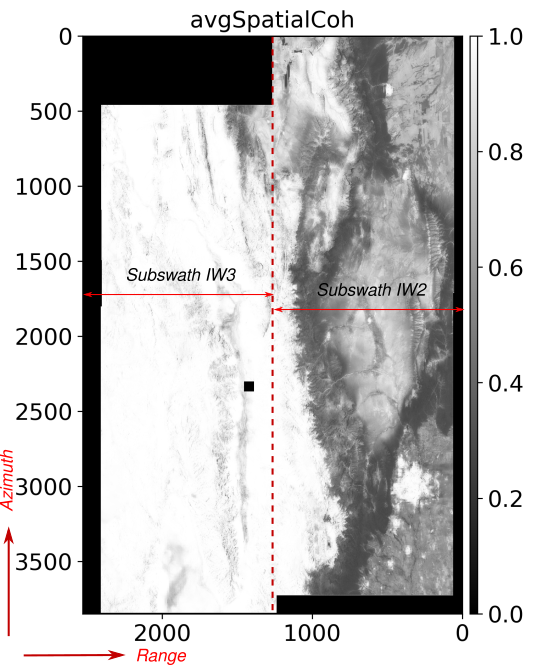

## Run the program

In [2]:
#Input Directory
indir='/DATA/utils_INSAR/Phase_Jump_Project/test/CAndes_S1_desc_t10_Cop_rg20az4_Cafayate'

#Burst Number
n_burst=10

#We are itnterest only in the IW3 subswath, therefore we the use --sub-x option
x0,x1=1300,2529


!python calculate_phasejumps_from_mintpystack.py --n-burst {n_burst} -i {indir} --sub-x {x0} {x1}  2>&1 | tee {indir}/phasejump.log

14:36:31 INFO     Checking input parameters
14:36:31 INFO     Calculations are done over AOI of 1229 pixels.
14:36:31 WARNING  Output directory not empty. Results will be overwritten.
14:36:31 INFO     Total of interferograms found: 462 
14:36:31 INFO     Calculating Absolute Gradient in the Azimuth Direction.
Pairs processed: 100%|██████████ [ time left: 00:00 ]
14:46:04 INFO     Processing Time 9.55 minutes


## Check Output
Most of the output files are saved in the output folder "pj_evaluation". After the program has finished, you will find the outputs in that folder.

In [3]:
!ls pj_evaluation/

coherence_cts.nc  intensity_pct.nc	stats_absolute_gradient.txt
figs		  median_az_grad_mm.nc


The files: 
- *coherence_cts.nc* provides a measure of the number of pixels per row per pair, from which the value of coherence is above the coherence minima set with the --cmin parameter
- *intensity_pct.nc* is a measure of how many pixels jump along a row, in percentage.
- *median_az_grad_mm.nc* is the median per row of the absolute gradient along the azimuth direction.

In [4]:
#To explore this files
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
def read_xr(fn):
    da=xr.open_dataarray(fn)
    da=da.squeeze()
    return da


da_coh_cts=read_xr('pj_evaluation/coherence_cts.nc')
da_int_pc=read_xr('pj_evaluation/intensity_pct.nc')
da_med_az_grad_mm=read_xr('pj_evaluation/median_az_grad_mm.nc')

print(da_coh_cts)


<xarray.DataArray 'NoNanCounts' (pair: 462, Y: 3850)>
[1778700 values with dtype=int16]
Coordinates:
  * pair     (pair) object '20160105_20160317' ... '20211210_20211222'
  * Y        (Y) int64 0 1 2 3 4 5 6 7 ... 3843 3844 3845 3846 3847 3848 3849


In [5]:
#Transform to plot
def transform_da(da):
    #Keep date12List
    date12List=da.pair.values.copy()
    da['pair']=np.arange(0,date12List.shape[0],1)
    return da, date12List

### coherence_cts.nc
The coherence_cts file is used to define how 'reliable' a row is

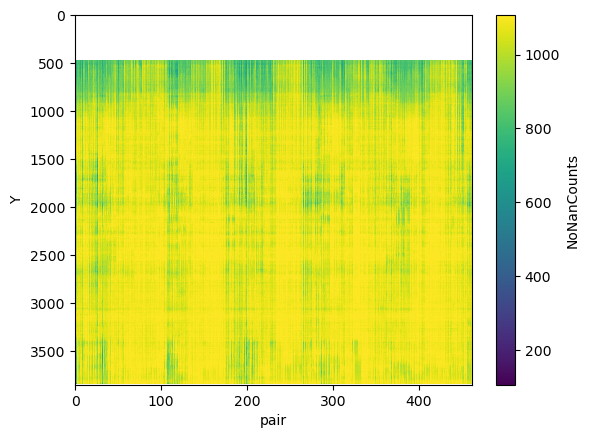

In [6]:
#-----------#
#Plot Coherence counts
#-----------#
da_coh_cts,_=transform_da(da_coh_cts)
#No data is zero
da_coh_cts=da_coh_cts.where(da_coh_cts!=0)
#
fig,ax=plt.subplots()
da_coh_cts.plot(x='pair',cmap='viridis',ax=ax)
#Rotate becuase this is a descending track
ax.invert_yaxis()

In [7]:
da_coh_cts.median()

<xarray.DataArray 'NoNanCounts' ()>
array(1071.)

We can see most of the rows have good coherence, since of a total of, 1229 pixels along the range direction, the median count is 1071 pixels/row with coherence >0.75 (cmin default). One most always check this output!


### intensity_pc.nc
The file contains the percentage of pixels with significant phase jumps per row. The larger the value, the larger the likelihood that the row contains a phase jump at the burst overlap areas.

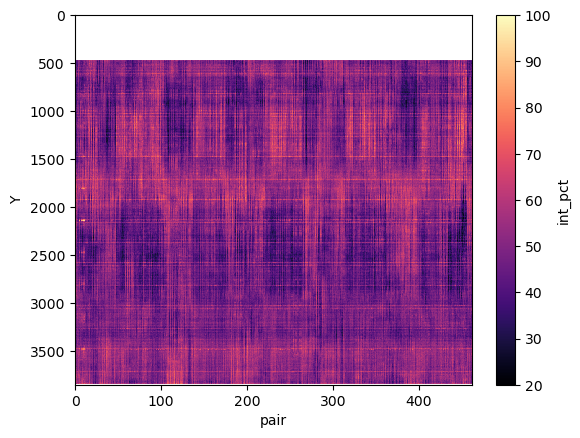

In [8]:
#-----------#
#Plot Intensity
#-----------#
da_int_pc,_=transform_da(da_int_pc)
#No data is zero
da_int_pc=da_int_pc.where(da_int_pc!=0)
#
fig,ax=plt.subplots()
da_int_pc.plot(x='pair',cmap='magma',ax=ax)
#Rotate becuase this is a descending track
ax.invert_yaxis()

We can already see some lines matching the phase jump at burst overlap areas. The coordinates detection of the phase jumps at the burst overlap areas is based exclusively on the intensity.

### median_az_grad_mm.nc
Contains the magnitude of the phase jump per row, measured in milimiters. This file is used to calculate the magnitude of the phase jump.

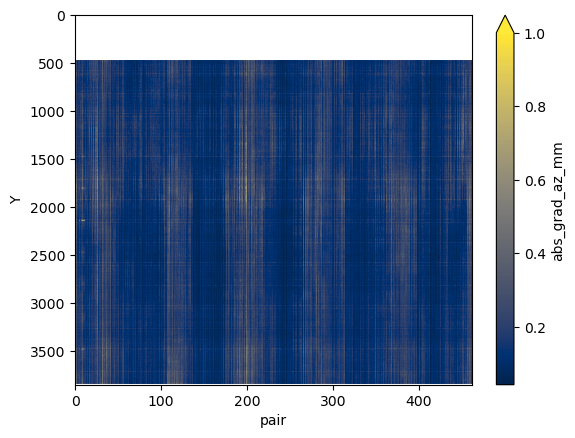

In [9]:
#-----------#
#Plot Intensity
#-----------#
da_med_az_grad_mm,_=transform_da(da_med_az_grad_mm)
#No data is zero
da_med_az_grad_mm=da_med_az_grad_mm.where(da_med_az_grad_mm!=0)
#
fig,ax=plt.subplots()
da_med_az_grad_mm.plot(x='pair',cmap='cividis',ax=ax,vmax=1)
#Rotate becuase this is a descending track
ax.invert_yaxis()

### Output statistics
The file *stats_absolute_gradient.txt* contains the statistics of all pairs in the stack.

In [10]:
! head -n 20 pj_evaluation/stats_absolute_gradient.txt

# No Data Values (Zero Values) were excluded from calculations.
# Coherence statistics were derived from all non-NaN pixels.
# Pixels with coherence < 0.75 were masked out during the calculation of absolute azimuth gradient and corresponding intensity.
# The number of masked-out pixels varies between pairs.
## Column Names/Prefixes:
# Btemp: Temporal Baseline
# Coh: Coherence
# Grad: Absolute gradient along the azimuth direction 
# Med: Median, Std: Standard deviation

DATE12,Btemp[days],Coh_Median,Coh_Mean,Coh_Std,Grad_Median_mm,Grad_Mean_mm,Grad_Std_mm
20160105_20160317,72.0,0.98,0.9,0.18,0.27,0.38,0.36
20160105_20160410,96.0,0.97,0.89,0.19,0.29,0.41,0.38
20160105_20160504,120.0,0.97,0.88,0.19,0.3,0.43,0.41
20160317_20160410,24.0,0.99,0.96,0.11,0.16,0.23,0.23
20160317_20160504,48.0,0.99,0.95,0.12,0.16,0.25,0.28
20160317_20160528,72.0,0.99,0.95,0.13,0.18,0.26,0.26
20160410_20160504,24.0,0.99,0.94,0.14,0.17,0.27,0.3
20160410_20160528,48.0,0.99,0.96,0.11,0.2,0.28,0.28
20160410_20160715,

### Output figures and text files

Figure *masked_intensity.png* shows all sequential masks applied on the intensity. The unmasked rows are considered reliable and are used to estimate the coordinates of the phase jumps.
If the --msk-avgCoh option is enabled, the figure is a three-panel figure, and the last plot corresponds to the mask applied by average coherence. Otherwise, it is a two-panel figure.

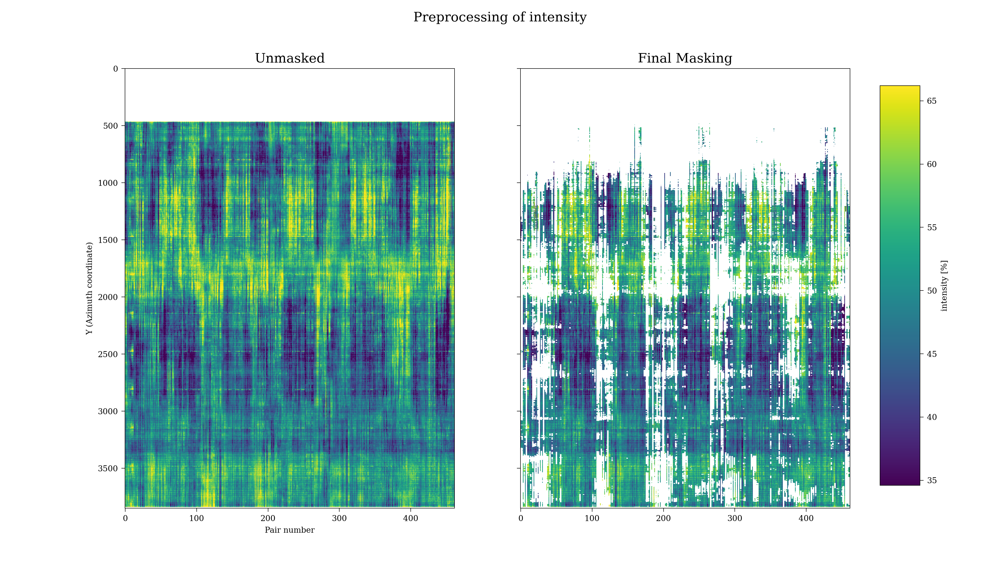

The figure *detrended_intensity.png*, is a two-panel figure. The first panel shows the masked detrended intensity. To perform detrending, we divide each row by the median of that row in pairs. We use the detrended gradient and calculate its gradient (right). The gradient is used in the detection of the phase jump coordinates. Note how clear the phase jump at  burst overlap can be seen.

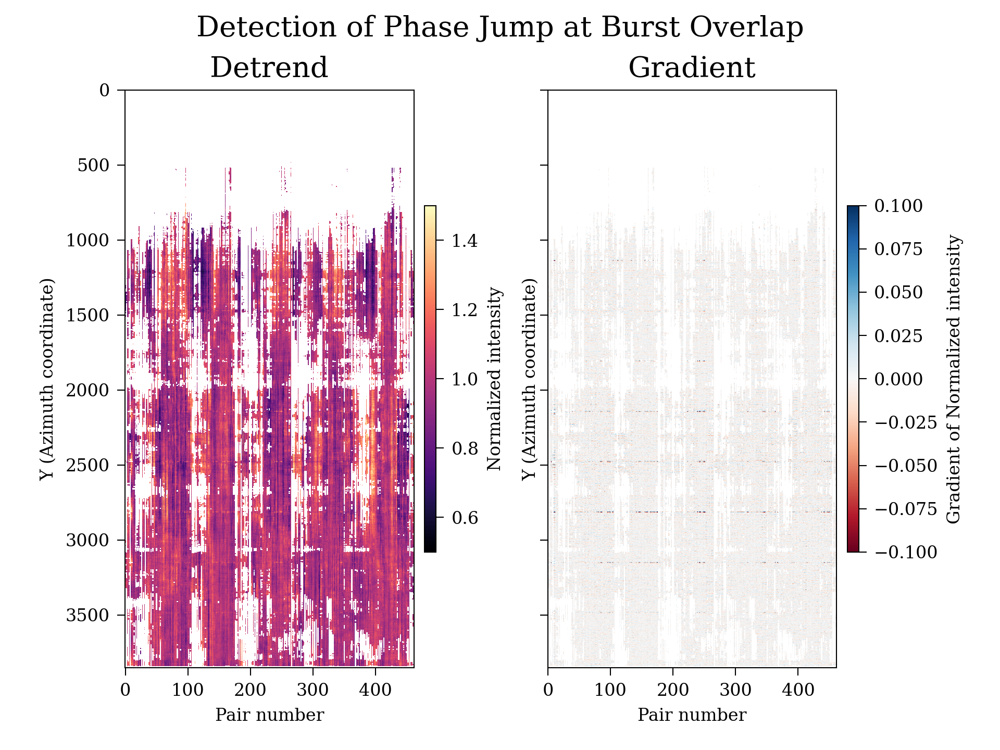

The detected coordinates are stored in a text file called *pj_coordinates.txt*. You can check if these coordinates are correct by loading them and calculating the difference between them. If the study area has a bad coherence, it is possible that not all coordinates are found.

In [11]:
!cat pj_coordinates.txt

#Coordinates of Phase Jump
#Y (row index)
798
1134
1469
1804
2140
2811
3147
3482


In [12]:
pj_coord=np.loadtxt('pj_coordinates.txt',skiprows=2, dtype=int)
print('Coordinates of  phase jump', pj_coord)
print('Dif. between coordinates', np.diff(pj_coord))

Coordinates of  phase jump [ 798 1134 1469 1804 2140 2811 3147 3482]
Dif. between coordinates [336 335 335 336 671 336 335]


Note that one coordinate of busrt overlap is not detected: we have processed 10 bursts, and we expect to find 9 burst overlaps, but we have detected only 8. For that reason, the difference of 671 pixels between the coordinates 2140 and 2811. However, if we divide by two, 671/2=335.5. The fact that the difference is 335-336 pixels and is regular indicates that we have positively found the coordinates of the burst overlap zones.



Another file is the *magnitude_phase_jumps.txt*, which contains the accumulated phase jump. It is the magnitude resulting from measuring the phase jumps (with the median_abs_az_gradient) at the coordinates indicated in the pj_coord document.

In [13]:
! head -n 10 magnitude_phase_jumps.txt

# Pairs found with systematic phase jumps 
# Magnitude_PJ_mm: Magnitude of the phase jump in mm, calculated with: 
# mean(phase jump of overlapping areas) * number of overlapping areas 
# DATE12 		Magnitude_PJ_mm
20160105_20160317	2.87
20160105_20160410	2.89
20160105_20160504	3.01
20160317_20160410	1.68
20160317_20160504	1.56
20160317_20160528	5.28


### Exclude list of interferograms and dates

The list of interferograms and dates to be excluded is defined by the **--pj-thr** parameter. This parameter sets the maximum cumulative phase jump allowed and its default value is 5 mm. Then, all pairs exceeding this value are listed in file
*exclude_listdate12_interferograms_by_phase_jump.txt*


In [14]:
!cat exclude_listdate12_interferograms_by_phase_jump.txt

**********

List of pairs skipped from assessment (mean coherence < 0.4): 


Indexes pairs skipped:


Total pairs skipped: 0 

**********


List of pairs with phase jumps larger than threshold: 
20160317_20160528,20160410_20160528,20160410_20160715,20160504_20160528,20160504_20160715,20160504_20160808

Indices of pairs with phase jump larger than threshold:
5,7,8,9,10,11

Total pairs with phase jump larger than threshold: 6 



The list of pairs omitted from the evaluation contains pairs that cannot be evaluated because the coherence is not good (in this case it is empty). 

The list of pairs with phase jumps greater than the threshold contains a list of interferograms that should be excluded, since they have a cumulative phase jump greater than the threshold. Note that this second list also provides the indices of those interferograms in the stack.

With those idexes, one could modify the smallbaselineApp.cfg before inverting them and exclude them from further processing by setting the option:
```python
mintpy.network.excludeIfgIndex = auto  #[1:5,25 / no], auto for no, list of ifg index (start from 0)
```



The file *exclude_dates_by_phase_jumps.txt* contains the dates detected as phase jump prone (dates with more than 50% of their interferograms with phase jump greater than the threshold). 

In [15]:
! cat exclude_dates_by_phase_jumps.txt

Dates with more than 50% of the pairs with significant phase jump 
